In [1]:
import h5py as h5
import numpy as np
from scipy.integrate import quad

import astropy.units as u
import astropy.constants as c

import matplotlib.pyplot as plt
import matplotlib.colors as colors
from importlib import reload

import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

import cogsworth

from legwork import evol, utils, source

import os

import time
import sys
# sys.path.append("../src/")
from compas_processing import mask_COSMIC_data, get_COSMIC_vars
from galaxy import simulate_mw, simulate_simple_mw
from variations import variations

%config InlineBackend.figure_format = 'retina'
plt.rc('font', family='serif')
fs = 20

In [2]:
class PopMatch(cogsworth.pop.Population):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def sample_initial_galaxy(self):
        """
        Sample a galaxy to roughly match metallicity of binaries.
        """
        self._initial_galaxy = self.sfh_model(size=0, **self.sfh_params)

        # Get bins, counts, from initial binaries
        maxZ = np.max(self._initial_binaries.metallicity.values) * 1.01
        minZ = np.min(self._initial_binaries.metallicity.values) * 0.99
        grid = np.linspace(np.log10(minZ), np.log10(maxZ), 50)
        inner_bins = np.array([grid[i] + (grid[i+1] - grid[i]) / 2 for i in range(len(grid) - 1)])
        self.bins = 10**np.concatenate(grid[0], inner_bins, grid[-1])
        self.bin_centers = 10**np.array([(self.bins[i] + self.bins[i+1])/2 for i in range(len(self.bins) - 1)])

        counts, _ = np.histogram(self._initial_binaries.metallicity.values, bins=self.bins)

        # Initialize galaxy counts
        galaxy_counts = np.zeros_like(counts)
        while np.sum(galaxy_counts) < np.sum(counts):
            print(self._initial_galaxy)
            # sample galaxy locations
            g = self.sfh_model(size=self.n_binaries_match, **self.sfh_params)

            for i in range(len(counts)):
                if galaxy_counts[i] == counts[i]:
                    continue
                i_locations = g[(self.bins[i] <= g.Z.value) & (g.Z.value < self.bins[i+1])]
                if (galaxy_counts[i] + len(i_locations) > counts[i]):
                    galaxy_locations = cogsworth.sfh.concat(galaxy_locations, i_locations[:int(counts[i] - galaxy_counts[i])])
                    galaxy_counts[i] += counts[i] - galaxy_counts[i]
            else:
                galaxy_counts[i] += len(i_locations)
                self._initial_galaxy = cogsworth.sfh.concat(self._initial_galaxy, i_locations)
        # sort by metallicity
        order = np.argsort(self._initial_galaxy.Z.value)
        self._initial_galaxy = self._initial_galaxy[order]

        # add relevant citations
        self.__citations__.extend([c for c in self._initial_galaxy.__citations__ if c != "cogsworth"])

        # if velocities are already set then just immediately return
        if all(hasattr(self._initial_galaxy, attr) for attr in ["v_R", "v_T", "v_z"]):   # pragma: no cover
            return

        # work out the initial velocities of each binary
        vel_units = u.km / u.s

        # calculate the Galactic circular velocity at the initial positions
        v_circ = self.galactic_potential.circular_velocity(q=[self._initial_galaxy.x,
                                                              self._initial_galaxy.y,
                                                              self._initial_galaxy.z]).to(vel_units)

        # add some velocity dispersion
        v_R, v_T, v_z = np.random.normal([np.zeros_like(v_circ), v_circ, np.zeros_like(v_circ)],
                                         self.v_dispersion.to(vel_units) / np.sqrt(3),
                                         size=(3, self.n_binaries_match))
        v_R, v_T, v_z = v_R * vel_units, v_T * vel_units, v_z * vel_units
        self._initial_galaxy.v_R = v_R
        self._initial_galaxy.v_T = v_T
        self._initial_galaxy.v_z = v_z



In [4]:
class StroopPop(cogsworth.pop.Population):
    def __init__(self, stroop_sample, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.stroop_sample = stroop_sample
        
    def sample_initial_binaries(self):
        """
        Sample initial binaries from the Stroop sample.
        """
        # Calculate galaxy weights
        grid = np.linspace(-4, np.log10(0.03), 50)
        inner_bins = np.array([grid[i] + (grid[i+1] - grid[i]) / 2 for i in range(len(grid) - 1)])
        bins = 10**np.hstack((grid[0], inner_bins, grid[-1]))
        bin_centers = 10**np.array([(bins[i] + bins[i+1])/2 for i in range(len(bins) - 1)])
        g = self.sfh_model(size=10_000_000, **self.sfh_params)
        counts, _ = np.histogram(g.Z.value, bins=bins)
        self.MW_weights = counts / np.sum(counts)

        # Add weights to Stroop sample
        stroop_bins = np.digitize(self.stroop_sample.metallicity.values, bins) - 1
        mapped_weights = np.take(self.MW_weights, stroop_bins)
        self.stroop_sample["MW_weights"] = mapped_weights

        # Sample binaries
#         self._initial_binaries = self.stroop_sample.sample(
#             n=self.n_binaries_match,
#             weights=self.stroop_sample["MW_weights"].values * self.stroop_sample["mixture_weight"].values,
#             replace=True)
        self._initial_binaries = self.stroop_sample

        # sort by metallicity
        order = np.argsort(self._initial_binaries.metallicity.values)
        self._initial_binaries = self._initial_binaries.iloc[order]

        # reset index
        self._initial_binaries.reset_index(drop=True, inplace=True)
        
        # temp fix: Reset bin_nums, store old bin_nums in new column
        self._initial_binaries["old_bin_num"] = self._initial_binaries["bin_num"]
        self._initial_binaries["bin_num"] = np.arange(self.n_binaries_match)

        self.sample_initial_galaxy()

        # update the metallicity and birth times of the binaries to match the galaxy
        # self._initial_binaries["metallicity"] = self._initial_galaxy.Z
        self._initial_binaries["tphysf"] = self._initial_galaxy.tau.to(u.Myr).value

    def sample_initial_galaxy(self):
        """
        Sample a galaxy to roughly match metallicity of binaries.
        """
        self._initial_galaxy = self.sfh_model(size=0, **self.sfh_params)

        # Get bins, counts, from initial binaries
        maxZ = np.max(self._initial_binaries.metallicity.values) * 1.01
        minZ = np.min(self._initial_binaries.metallicity.values) * 0.99
        grid = np.linspace(np.log10(minZ), np.log10(maxZ), 50)
        inner_bins = np.array([grid[i] + (grid[i+1] - grid[i]) / 2 for i in range(len(grid) - 1)])
        self.bins = 10**np.hstack((grid[0], inner_bins, grid[-1]))
        self.bin_centers = 10**np.array([(self.bins[i] + self.bins[i+1])/2 for i in range(len(self.bins) - 1)])

        counts, _ = np.histogram(self._initial_binaries.metallicity.values, bins=self.bins)
        
        # Initialize galaxy counts
        galaxy_counts = np.zeros_like(counts)
        while np.sum(galaxy_counts) < np.sum(counts):
            print(self._initial_galaxy)
            # sample galaxy locations
            g = self.sfh_model(size=10_000_000, **self.sfh_params)

            for i in range(len(counts)):
                if galaxy_counts[i] == counts[i]:
                    continue
                i_locations = g[(self.bins[i] <= g.Z.value) & (g.Z.value < self.bins[i+1])]
                if (galaxy_counts[i] + len(i_locations) > counts[i]):
                    random_inds = np.random.choice(len(i_locations), size=counts[i]-galaxy_counts[i], replace=False)
#                     self._initial_galaxy = cogsworth.sfh.concat(self._initial_galaxy, 
#                                                                 i_locations[:int(counts[i] - galaxy_counts[i])])
                    self._initial_galaxy = cogsworth.sfh.concat(self._initial_galaxy, 
                                                                i_locations[random_inds])
                    galaxy_counts[i] += counts[i] - galaxy_counts[i]
                else:
                    galaxy_counts[i] += len(i_locations)
                    self._initial_galaxy = cogsworth.sfh.concat(self._initial_galaxy, i_locations)
        # sort by metallicity
        print(self._initial_galaxy)
        order = np.argsort(self._initial_galaxy.Z.value)
        self._initial_galaxy = self._initial_galaxy[order]

        # add relevant citations
        self.__citations__.extend([c for c in self._initial_galaxy.__citations__ if c != "cogsworth"])

        # if velocities are already set then just immediately return
        if all(hasattr(self._initial_galaxy, attr) for attr in ["v_R", "v_T", "v_z"]):   # pragma: no cover
            return

        # work out the initial velocities of each binary
        vel_units = u.km / u.s

        # calculate the Galactic circular velocity at the initial positions
        v_circ = self.galactic_potential.circular_velocity(q=[self._initial_galaxy.x,
                                                              self._initial_galaxy.y,
                                                              self._initial_galaxy.z]).to(vel_units)

        # add some velocity dispersion
        v_R, v_T, v_z = np.random.normal([np.zeros_like(v_circ), v_circ, np.zeros_like(v_circ)],
                                         self.v_dispersion.to(vel_units) / np.sqrt(3),
                                         size=(3, self.n_binaries_match))
        v_R, v_T, v_z = v_R * vel_units, v_T * vel_units, v_z * vel_units
        self._initial_galaxy.v_R = v_R
        self._initial_galaxy.v_T = v_T
        self._initial_galaxy.v_z = v_z

    def __getitem__(self, ind):
        # convert any Pandas Series to numpy arrays
        ind = ind.values if isinstance(ind, pd.Series) else ind

        # if the population is associated with a file, make sure it's entirely loaded before slicing
        if self._file is not None:
            parts = ["initial_binaries", "bpp", "initial_galaxy", "orbits"]
            vars = [self._initial_binaries, self._bpp, self._initial_galaxy, self._orbits]
            masks = {f"has_{p}": False for p in parts}
            with h5.File(self._file, "r") as f:
                for p in parts:
                    masks[f"has_{p}"] = p in f
            missing_parts = [p for i, p in enumerate(parts) if (masks[f"has_{p}"] and vars[i] is None)]

            if len(missing_parts) > 0:
                raise ValueError(("This population was loaded from a file but you haven't loaded all parts "
                                  "yet. You need to do this before indexing it. The missing parts are: "
                                  f"{missing_parts}. You either need to access each of these variables or "
                                  "reload the entire population using all parts."))

        # ensure indexing with the right type
        ALLOWED_TYPES = (int, slice, list, np.ndarray, tuple)
        if not isinstance(ind, ALLOWED_TYPES):
            raise ValueError((f"Can only index using one of {[at.__name__ for at in ALLOWED_TYPES]}, "
                              f"you supplied a '{type(ind).__name__}'"))

        # check validity of indices for array-like types
        if isinstance(ind, (list, tuple, np.ndarray)):
            # check every element is a boolean (if so, convert to bin_nums after asserting length sensible)
            if all(isinstance(x, (bool, np.bool_)) for x in ind):
                assert len(ind) == len(self.bin_nums), "Boolean mask must be same length as the population"
                ind = self.bin_nums[ind]
            # otherwise ensure all elements are integers
            else:
                assert all(isinstance(x, (int, np.integer)) for x in ind), \
                    "Can only index using integers or a boolean mask"
                if len(np.unique(ind)) < len(ind):
                    warnings.warn(("You have supplied duplicate indices, this will invalidate the "
                                   "normalisation of the Population (e.g. mass_binaries will be wrong)"))

        # set up the bin_nums we are selecting
        bin_nums = ind

        # turn ints into arrays and convert slices to exact bin_nums
        if isinstance(ind, int):
            bin_nums = [ind]
        elif isinstance(ind, slice):
            bin_nums = self.bin_nums[ind]
        bin_nums = np.asarray(bin_nums)

        # check that the bin_nums are all valid
        check_nums = np.isin(bin_nums, self.bin_nums)
        if not check_nums.all():
            raise ValueError(("The index that you supplied includes a `bin_num` that does not exist. "
                              f"The first bin_num I couldn't find was {bin_nums[~check_nums][0]}"))

        # start a new population with the same parameters
        new_pop = self.__class__(stroop_sample=self.stroop_sample, n_binaries=len(bin_nums), processes=self.processes,
                                 m1_cutoff=self.m1_cutoff, final_kstar1=self.final_kstar1,
                                 final_kstar2=self.final_kstar2, sfh_model=self.sfh_model,
                                 sfh_params=self.sfh_params, galactic_potential=self.galactic_potential,
                                 v_dispersion=self.v_dispersion, max_ev_time=self.max_ev_time,
                                 timestep_size=self.timestep_size, BSE_settings=self.BSE_settings,
                                 sampling_params=self.sampling_params,
                                 store_entire_orbits=self.store_entire_orbits)
        new_pop.n_binaries_match = new_pop.n_binaries

        # proxy for checking whether sampling has been done
        if self._mass_binaries is not None:
            new_pop._mass_binaries = self._mass_binaries
            new_pop._mass_singles = self._mass_singles
            new_pop._n_singles_req = self._n_singles_req
            new_pop._n_bin_req = self._n_bin_req

        bin_num_to_ind = {num: i for i, num in enumerate(self.bin_nums)}
        sort_idx = np.argsort(list(bin_num_to_ind.keys()))
        idx = np.searchsorted(list(bin_num_to_ind.keys()), bin_nums, sorter=sort_idx)
        inds = np.asarray(list(bin_num_to_ind.values()))[sort_idx][idx]

        if self._initial_galaxy is not None:
            new_pop._initial_galaxy = self._initial_galaxy[inds]
        if self._initC is not None:
            new_pop._initC = self._initC.loc[bin_nums]
        if self._initial_binaries is not None:
            new_pop._initial_binaries = self._initial_binaries.loc[bin_nums]

        # checking whether stellar evolution has been done
        if self._bpp is not None:
            # copy over subsets of data when they aren't None
            new_pop._bpp = self._bpp.loc[bin_nums]
            if self._bcm is not None:
                new_pop._bcm = self._bcm.loc[bin_nums]
            if self._kick_info is not None:
                new_pop._kick_info = self._kick_info.loc[bin_nums]
            if self._final_bpp is not None:
                new_pop._final_bpp = self._final_bpp.loc[bin_nums]
            if self._disrupted is not None:
                new_pop._disrupted = self._disrupted[inds]
            if self._classes is not None:
                new_pop._classes = self._classes.iloc[inds]
            if self._observables is not None:
                new_pop._observables = self._observables.iloc[inds]

            if self._orbits is not None or self._final_pos is not None or self._final_vel is not None:
                disrupted_bin_num_to_ind = {num: i for i, num in enumerate(self.bin_nums[self.disrupted])}
                sort_idx = np.argsort(list(disrupted_bin_num_to_ind.keys()))
                idx = np.searchsorted(list(disrupted_bin_num_to_ind.keys()),
                                      bin_nums[np.isin(bin_nums, self.bin_nums[self.disrupted])],
                                      sorter=sort_idx)
                inds_with_disruptions = np.asarray(list(disrupted_bin_num_to_ind.values()))[sort_idx][idx]\
                      + len(self)
                all_inds = np.concatenate((inds, inds_with_disruptions)).astype(int)

            # same thing but for arrays with appended disrupted secondaries
            if self._orbits is not None:
                new_pop._orbits = self.orbits[all_inds]
            if self._final_pos is not None:
                new_pop._final_pos = self._final_pos[all_inds]
            if self._final_vel is not None:
                new_pop._final_vel = self._final_vel[all_inds]
        return new_pop


In [65]:
file = "/hildafs/projects/phy230054p/fep/stroopwafel_dir/stroopwafel/tests/output/NSNS/hubble_merge/NSNS.h5"

# PERMANENT SOLUTION
DCO_where = 'is_hit == 1'
DCO_df = pd.read_hdf(file, key='initC', where=DCO_where)
DCO_nums = DCO_df.bin_num.values
weights = pd.read_hdf(file, key='weights')
DCO_weights = weights.loc[np.isin(weights['bin_num'], DCO_nums)].mixture_weight.values
DCO_df['mixture_weight'] = DCO_weights

In [66]:
BSEDict = {'xi': 1.0, 'bhflag': 1, 'neta': 0.5, 'windflag': 3, 'wdflag': 1, 'alpha1': 1.0, 'pts1': 0.001, 'pts3': 0.02, 
            'pts2': 0.01, 'epsnov': 0.001, 'hewind': 0.5, 'ck': 1000, 'bwind': 0.0, 'lambdaf': 0.0, 'mxns': 3.0, 'beta': -1.0, 
            'tflag': 1, 'acc2': 1.5, 'grflag' : 1, 'remnantflag': 4, 'ceflag': 0, 'eddfac': 1.0, 'ifflag': 0, 'bconst': 3000, 
            'sigma': 265.0, 'gamma': -2.0, 'pisn': 45.0, 
            'natal_kick_array' : [[-100.0,-100.0,-100.0,-100.0,0.0], [-100.0,-100.0,-100.0,-100.0,0.0]], 'bhsigmafrac' : 1.0, 
            'polar_kick_angle' : 90, 'qcrit_array' : [0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0], 
            'cekickflag' : 2, 'cehestarflag' : 0, 'cemergeflag' : 0, 'ecsn' : 2.5, 'ecsn_mlow' : 1.4, 'aic' : 1, 'ussn' : 0, 
            'sigmadiv' :-20.0, 'qcflag' : 2, 'eddlimflag' : 0, 
            'fprimc_array' : [2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0,2.0/21.0], 
            'bhspinflag' : 0, 'bhspinmag' : 0.0, 'rejuv_fac' : 1.0, 'rejuvflag' : 0, 'htpmb' : 1, 'ST_cr' : 1, 'ST_tide' : 1, 
            'bdecayfac' : 1, 'rembar_massloss' : 0.5, 'kickflag' : 1, 'zsun' : 0.014, 'bhms_coll_flag' : 0, 'don_lim' : -1, 
            'acc_lim' : -1, 'rtmsflag' : 0, 'wd_mass_lim': 1}

In [67]:
p = StroopPop(n_binaries=len(DCO_df), processes=54, BSE_settings=BSEDict,
               stroop_sample=DCO_df)

In [68]:
p.sample_initial_binaries()

<Wagg2022, size=0>
<Wagg2022, size=5127>
<Wagg2022, size=5321>


In [69]:
stellar_start = time.time()
p.perform_stellar_evolution()
print(time.time() - stellar_start)

48.72535729408264


In [10]:
p.final_bpp.columns

Index(['tphys', 'mass_1', 'mass_2', 'kstar_1', 'kstar_2', 'sep', 'porb', 'ecc',
       'RRLO_1', 'RRLO_2', 'evol_type', 'aj_1', 'aj_2', 'tms_1', 'tms_2',
       'massc_1', 'massc_2', 'rad_1', 'rad_2', 'mass0_1', 'mass0_2', 'lum_1',
       'lum_2', 'teff_1', 'teff_2', 'radc_1', 'radc_2', 'menv_1', 'menv_2',
       'renv_1', 'renv_2', 'omega_spin_1', 'omega_spin_2', 'B_1', 'B_2',
       'bacc_1', 'bacc_2', 'tacc_1', 'tacc_2', 'epoch_1', 'epoch_2',
       'bhspin_1', 'bhspin_2', 'bin_num', 'metallicity'],
      dtype='object')

In [70]:
galaxy_start = time.time()
p.perform_galactic_evolution()
print(time.time() - galaxy_start)

100%|██████████| 5321/5321 [00:03<00:00, 1372.57it/s]


50.52107000350952


In [12]:
len(p.final_pos)

369851

In [71]:
sources = p.to_legwork_sources(assume_mw_galactocentric=True)
sources

<Source: 146 sources>

In [72]:
sources.get_snr()
np.sort(sources.snr)[-42:]

array([3.30343482e-03, 3.69373320e-03, 3.76344691e-03, 3.76479303e-03,
       3.77544897e-03, 3.86088299e-03, 4.24271108e-03, 4.46557933e-03,
       4.53199143e-03, 4.57762331e-03, 4.68146184e-03, 5.24451538e-03,
       5.50315317e-03, 5.52130648e-03, 6.52779084e-03, 6.55273948e-03,
       6.83387854e-03, 6.94141881e-03, 7.20444144e-03, 7.46698087e-03,
       9.21297190e-03, 9.29796000e-03, 9.50921680e-03, 9.57726696e-03,
       1.07651718e-02, 1.44731047e-02, 1.47460576e-02, 1.53134850e-02,
       1.59814925e-02, 1.62825152e-02, 1.65361322e-02, 1.86599625e-02,
       2.08372931e-02, 2.32726747e-02, 2.62165896e-02, 3.65213069e-02,
       3.69782786e-02, 9.63356420e-02, 1.31210306e-01, 1.33431145e-01,
       6.70576688e-01, 4.15320741e+00])

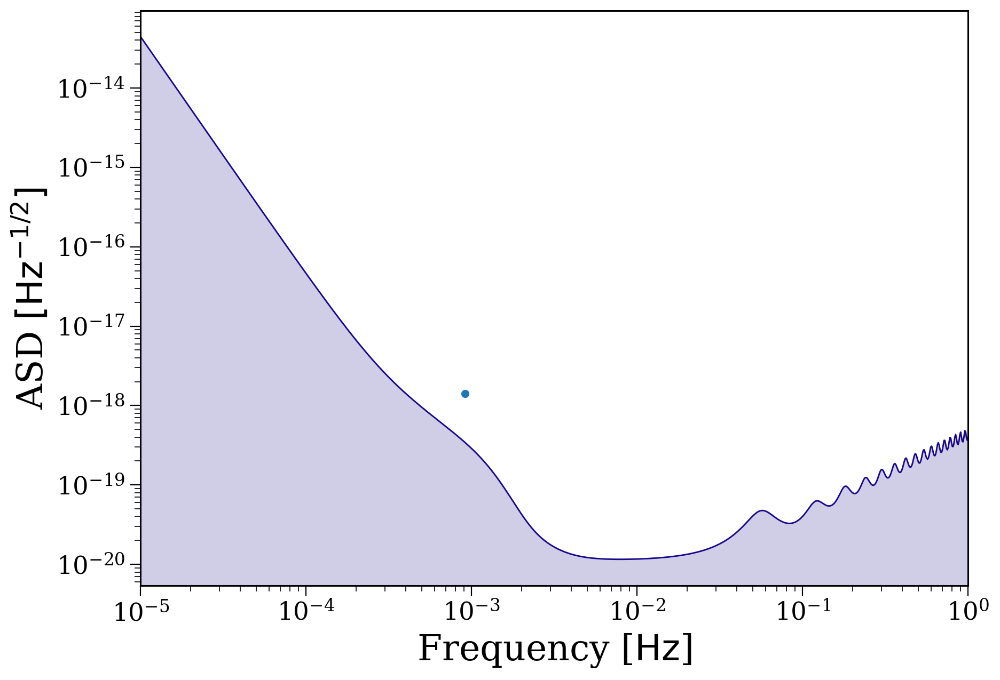

In [74]:
sources.plot_sources_on_sc(snr_cutoff=4);

In [75]:
sources_mask = p.final_bpp["sep"] > 0.0
sources_bpp = p.final_bpp[sources_mask]
print(len(sources_bpp))


146


In [76]:
full_snr = np.zeros(len(p.final_pos))
full_snr[sources_mask] = sources.snr
print(len(full_snr[full_snr > 0]))
snr7_mask = full_snr > 4

146


8.25038537873401
1


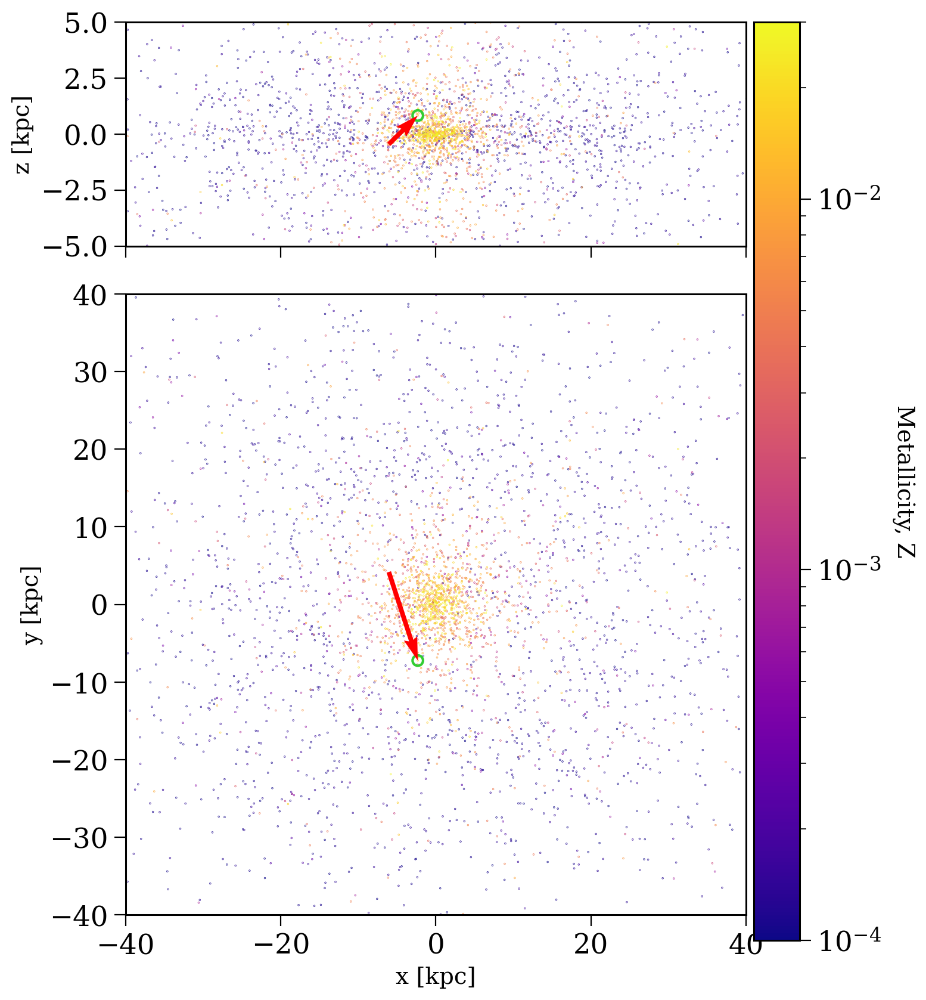

In [77]:
# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy
print(np.mean(g.tau.value))
pos = p.final_pos

# A smaller, denser core
x = pos[:,0]
y = pos[:,1]
z = pos[:,2]
met = g.Z.value

LISAx = pos[:,0][snr7_mask]
initx = g.x[snr7_mask]
dx = LISAx - initx
print(len(LISAx))
LISAy = pos[:,1][snr7_mask]
inity = g.y[snr7_mask]
dy = LISAy - inity
LISAz = pos[:,2][snr7_mask]
initz = g.z[snr7_mask]
dz = LISAz - initz
LISAmet = g.Z.value[snr7_mask]
# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

ax1.scatter(LISAx, LISAz, s=40, facecolors='none', edgecolors='limegreen', linewidths=1.5, alpha=1) # Outline with a larger marker

ax1.quiver(initx, initz, dx, dz, angles='xy', scale_units='xy', scale=1, color='red')

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

ax2.scatter(LISAx, LISAy, s=40, facecolors='none', edgecolors='limegreen', linewidths=1.5, alpha=1) # Outline with a larger marker

ax2.quiver(initx, inity, dx, dy, angles='xy', scale_units='xy', scale=1, color='red')

# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-40, 40)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-40, 40)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.savefig("NSNS_arrow_galaxy.png", format='png', dpi=150)
plt.show()


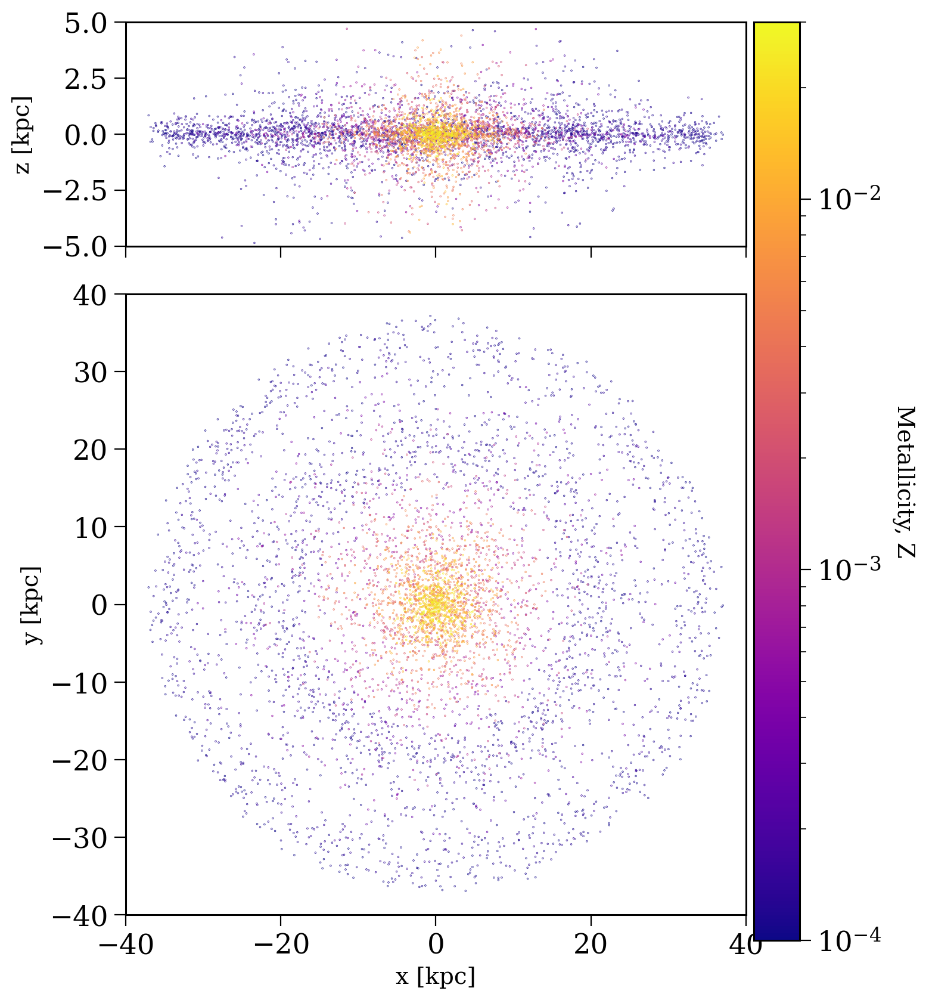

In [78]:
# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy

# A smaller, denser core
x = g.x.value
y = g.y.value
z = g.z.value
met = g.Z.value

# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)


# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-40, 40)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-40, 40)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.savefig("NSNS_initial_galaxy.png", format='png', dpi=150)
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


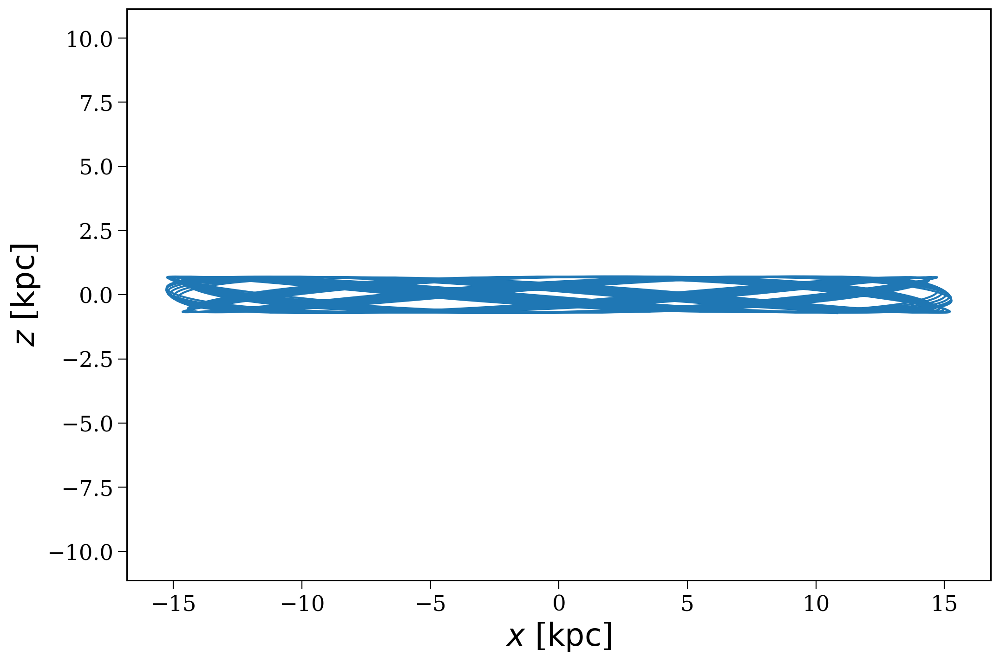

In [57]:
fig, ax = plt.subplots()
# bound_orbits = p.primary_orbits[~p.disrupted]
snr7_orbits = p.primary_orbits[snr7_mask]
# for orbit in snr7_orbits:
#     orbit.plot(['x','z'], axes=[ax])
#     plt.show()
np.random.choice(snr7_orbits).plot(['x', 'z'], axes=[ax])
plt.show()

9.073146230902596
12


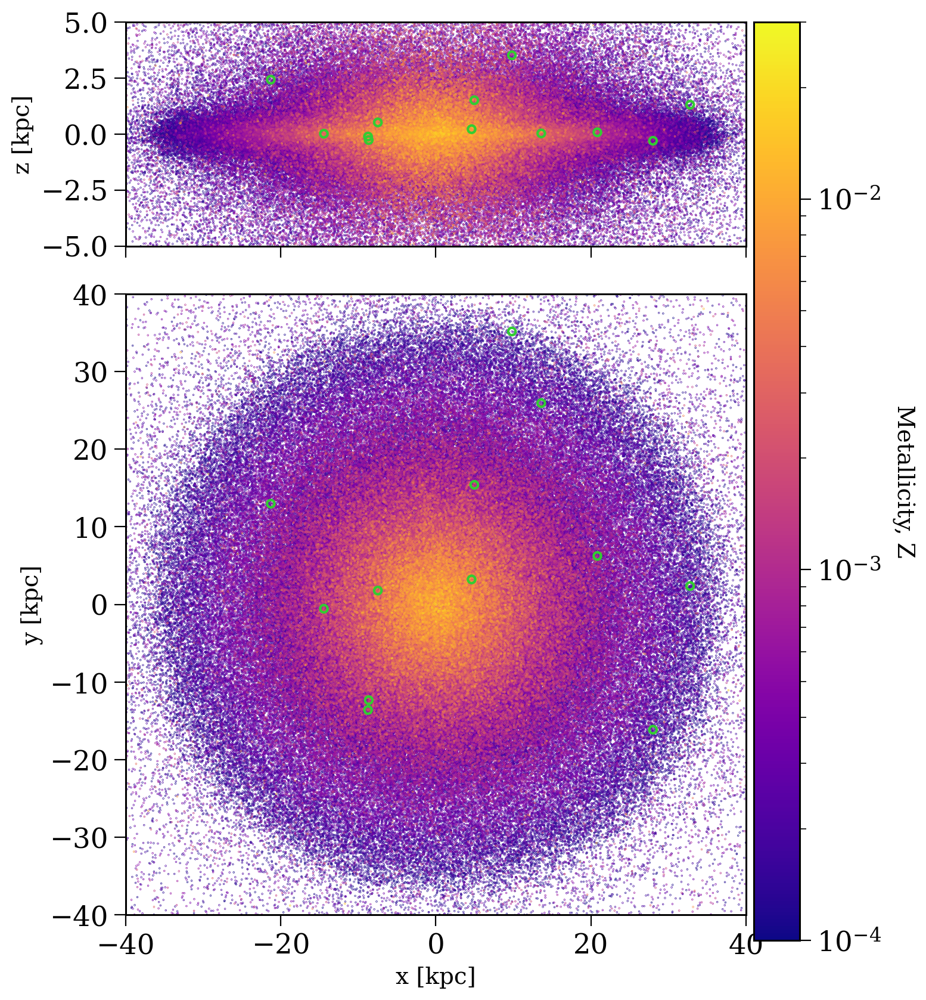

In [29]:

# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy
print(np.mean(g.tau.value))
pos = p.final_pos

# A smaller, denser core
x = pos[:,0]
y = pos[:,1]
z = pos[:,2]
met = g.Z.value

LISAx = pos[:,0][snr7_mask]
print(len(LISAx))
LISAy = pos[:,1][snr7_mask]
LISAz = pos[:,2][snr7_mask]
LISAmet = g.Z.value[snr7_mask]
# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

ax1.scatter(LISAx, LISAz, s=20, facecolors='none', edgecolors='limegreen', linewidths=1.5, alpha=1) # Outline with a larger marker

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

ax2.scatter(LISAx, LISAy, s=20, facecolors='none', edgecolors='limegreen', linewidths=1.5, alpha=1) # Outline with a larger marker

# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-40, 40)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-40, 40)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.show()

In [43]:
star_met = p._initial_binaries.metallicity.values
gal_met = p._initial_galaxy.Z.value

diff = abs(star_met - gal_met)

print(np.mean(diff))


1.1772647610115552e-05


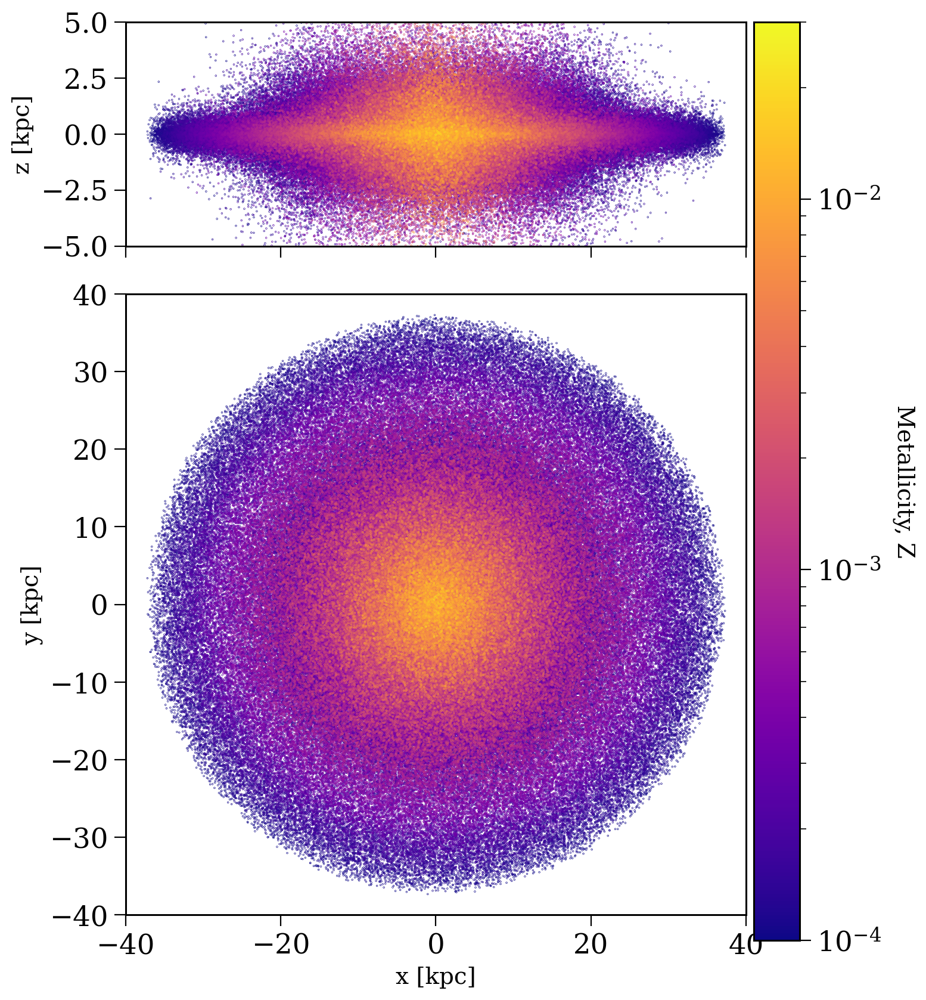

In [30]:
# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy

# A smaller, denser core
x = g.x.value
y = g.y.value
z = g.z.value
met = g.Z.value

# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)


# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-40, 40)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-40, 40)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.show()

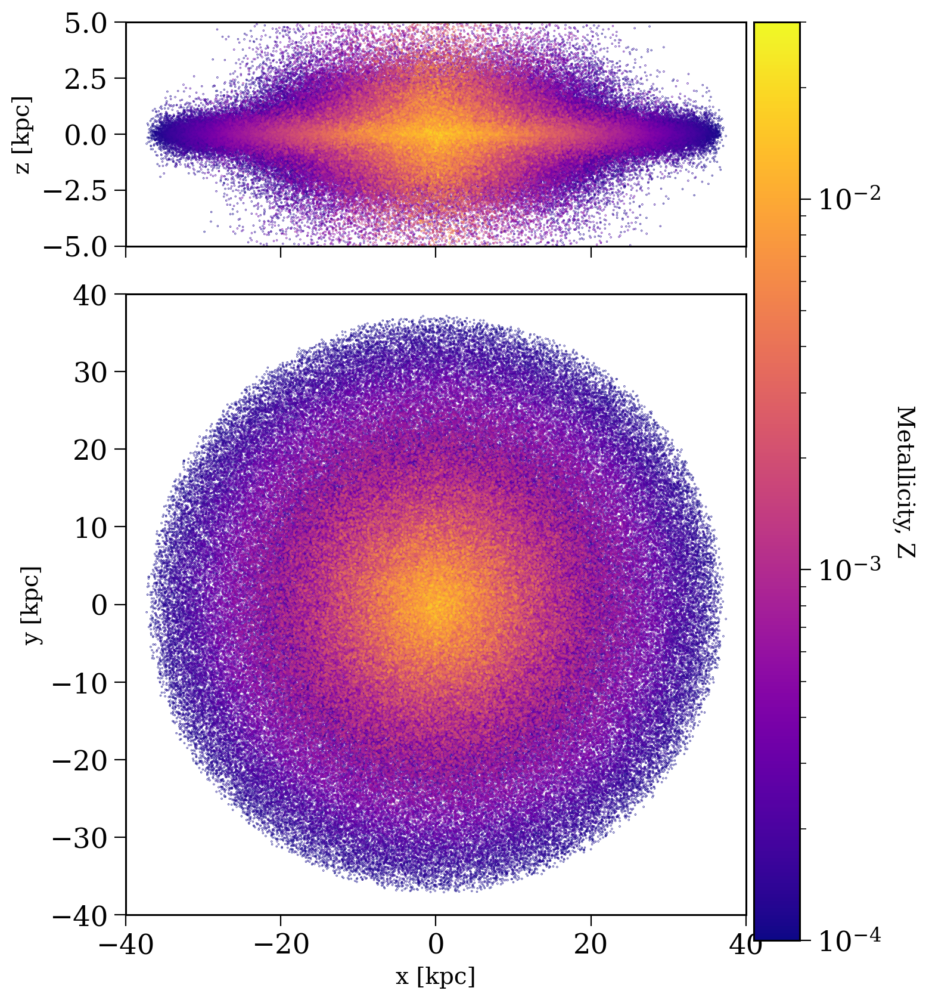

In [45]:
# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy

# A smaller, denser core
x = g.x.value
y = g.y.value
z = g.z.value
met = g.Z.value

# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)


# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-40, 40)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-40, 40)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.show()

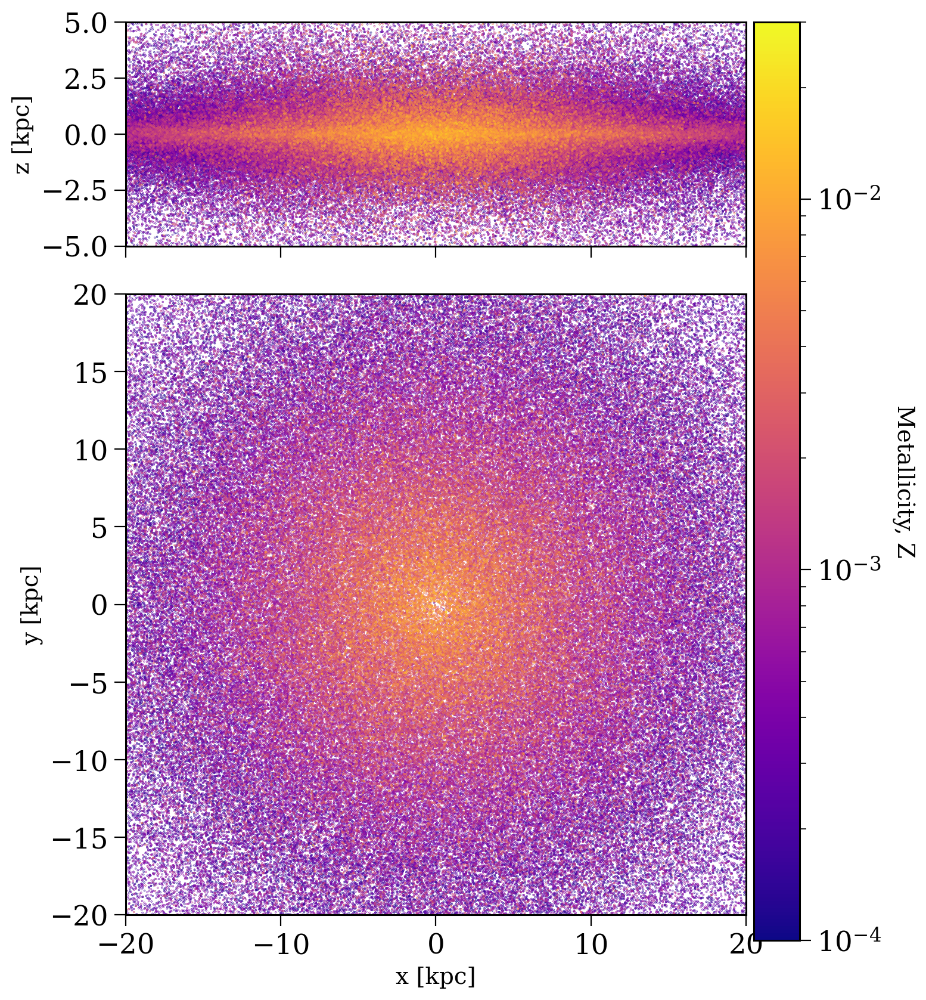

In [19]:
# --- 1. Load your data ---
# For this example, we'll generate some random mock data.
# Replace this section with loading your own data.

g = p._initial_galaxy
pos = p.final_pos

# A smaller, denser core
x = pos[:,0]
y = pos[:,1]
z = pos[:,2]
met = g.Z.value

# --- 2. Set up the figure and subplots ---
# Create a figure with 2 rows, 1 column.
# Use gridspec_kw to make the top plot (edge-on) shorter than the bottom one.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                               gridspec_kw={'height_ratios': [1, 3]})
fig.subplots_adjust(hspace=0.05) # Reduce space between plots


# --- 3. Define the color normalization ---
# Use a logarithmic scale for the color map, similar to the original plot.
# The `vmin` and `vmax` should be set based on your data's metallicity range.
norm = colors.LogNorm(vmin=1e-4, vmax=3e-2)
cmap = 'plasma' # This colormap is similar to the one in the image.


# --- 4. Create the scatter plots ---
# Use a small marker size `s` for a denser look.
marker_size = 0.05

# Top plot: Edge-on view (x vs z)
ax1.scatter(x, z, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)

# Bottom plot: Face-on view (x vs y)
sc = ax2.scatter(x, y, s=marker_size, c=met, cmap=cmap, norm=norm, rasterized=True)


# --- 5. Set labels and limits ---
# Top plot labels and limits
ax1.set_ylabel('z [kpc]', fontsize=14)
ax1.set_ylim(-5, 5)
ax1.set_xlim(-20, 20)

# Bottom plot labels and limits
ax2.set_xlabel('x [kpc]', fontsize=14)
ax2.set_ylabel('y [kpc]', fontsize=14)
ax2.set_ylim(-20, 20)
# Ensure the aspect ratio is equal for a non-distorted view
ax2.set_aspect('equal', adjustable='box')


# --- 6. Add a shared color bar ---
# Add a color bar to the right of the figure
cbar = fig.colorbar(sc, ax=[ax1, ax2], pad=0.01)
cbar.set_label('Metallicity, Z', fontsize=14, rotation=270, labelpad=20)


# --- 7. Display the plot ---
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


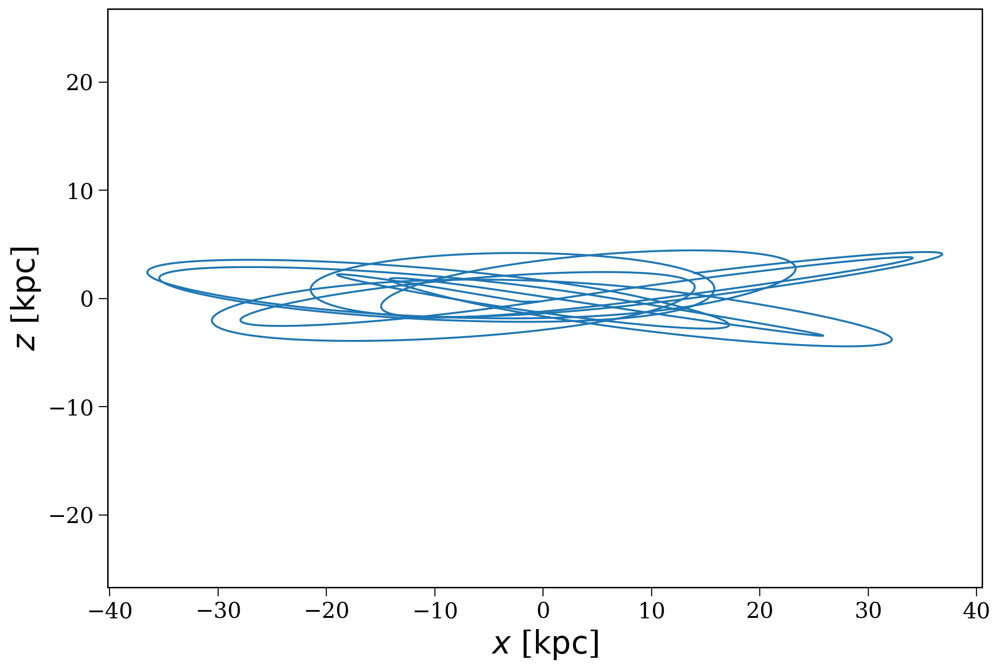

In [67]:
fig, ax = plt.subplots()
bound_orbits = p.primary_orbits[~p.disrupted]
np.random.choice(bound_orbits).plot(['x', 'z'], axes=[ax])
plt.show()